# Week 4 - Individual Exploration - Zhendong Long (Jayden)


## 1. Description

This week, I spent most of my time processing the migration data to look for some conclusions for the next research steps. Specifically, I collected the CSV files for the migration population (metro to metro and county to county). I hope to know where the migration flow goes at both the national and regional scales. Then, I also collected the geo-spatial SHP file that contains the geo-data for all counties and metros so that I can match my CSV with those geo-data and map them out in a visual format.

## 2. Set up the platform

First, I want to import the two modules that I will be using in this project.

In [1]:
# for general data wrangling tasks
import pandas as pd

# to read and visualize spatial data
import geopandas as gpd

Now, those two modules are imported and ready to be used.

## 3. Import my SHP geo data for "county borders"

First, I want to set up the geo-data and process them so that they are ready to be matched with in the following sections. 

This geo-data is a SHP file that contains the geometry info. Now, I'm gonna import it:

In [2]:
countyborder = gpd.read_file('data2/countyborder/cb_2018_us_county_500k.shp')

Now, this geo-data is ready to be processed. 

Then, I wanna take a look what this dataset looks like:

In [3]:
countyborder.head()

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry
0,21,007,00516850,0500000US21007,21007,Ballard,06,639387454,69473325,"POLYGON ((-89.18137 37.04630, -89.17938 37.053..."
1,21,017,00516855,0500000US21017,21017,Bourbon,06,750439351,4829777,"POLYGON ((-84.44266 38.28324, -84.44114 38.283..."
2,21,031,00516862,0500000US21031,21031,Butler,06,1103571974,13943044,"POLYGON ((-86.94486 37.07341, -86.94346 37.074..."
3,21,065,00516879,0500000US21065,21065,Estill,06,655509930,6516335,"POLYGON ((-84.12662 37.64540, -84.12483 37.646..."
4,21,069,00516881,0500000US21069,21069,Fleming,06,902727151,7182793,"POLYGON ((-83.98428 38.44549, -83.98246 38.450..."


Great. It contains lots of important geo-data that can help do the maps.

Now, I want to check if what kinds of data each column has and if there's any null values:

In [4]:
countyborder.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 3233 entries, 0 to 3232
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   STATEFP   3233 non-null   object  
 1   COUNTYFP  3233 non-null   object  
 2   COUNTYNS  3233 non-null   object  
 3   AFFGEOID  3233 non-null   object  
 4   GEOID     3233 non-null   object  
 5   NAME      3233 non-null   object  
 6   LSAD      3233 non-null   object  
 7   ALAND     3233 non-null   int64   
 8   AWATER    3233 non-null   int64   
 9   geometry  3233 non-null   geometry
dtypes: geometry(1), int64(2), object(7)
memory usage: 252.7+ KB


This dataset looks good. Seems like the values are goods, the geometry data is in the right datatype. the "GEOID" is in the right data type as well - they are "objects" instead of "integer" and this is what I am looking for because some Geodata has the numbers starting with a "0". Treating this column as "objects" instead of "integer" makes it work when doing matching and data processing. 

Next, I want to trim the dataset a little bit because I think only "GEOID", "Name", and "Geometry" columns are important for this project.

First, I want to a list of the columns:

In [5]:
list(countyborder)

['STATEFP',
 'COUNTYFP',
 'COUNTYNS',
 'AFFGEOID',
 'GEOID',
 'NAME',
 'LSAD',
 'ALAND',
 'AWATER',
 'geometry']

Good. Those columns are what I expected. I then need to trim some columns that I don't need

I will write down what columns I need and name a new dataframe that only contains the columns I need:

In [6]:
columns_to_keep = ['GEOID','STATEFP','NAME','geometry']

countyborder_trimmed1 = countyborder [columns_to_keep]

countyborder_trimmed1

,GEOID,STATEFP,NAME,geometry
0,21007,21,Ballard,"POLYGON ((-89.18137 37.04630, -89.17938 37.053..."
1,21017,21,Bourbon,"POLYGON ((-84.44266 38.28324, -84.44114 38.283..."
2,21031,21,Butler,"POLYGON ((-86.94486 37.07341, -86.94346 37.074..."
3,21065,21,Estill,"POLYGON ((-84.12662 37.64540, -84.12483 37.646..."
4,21069,21,Fleming,"POLYGON ((-83.98428 38.44549, -83.98246 38.450..."
...,...,...,...,...
3228,31073,31,Gosper,"POLYGON ((-100.09510 40.43866, -100.08937 40.4..."
3229,39075,39,Holmes,"POLYGON ((-82.22066 40.66758, -82.19327 40.667..."
3230,48171,48,Gillespie,"POLYGON ((-99.30400 30.49983, -99.28234 30.499..."
3231,55079,55,Milwaukee,"POLYGON ((-88.06959 42.86726, -88.06959 42.872..."


Great. This new dataframe contains the three columns I need. 

Now, I want to quickly go through the entire list to make sure all data looks ok.

First, I need to overwrite the default settings:

In [7]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

Now, I should be able to view the entire list. Let me take a look:

In [8]:
countyborder_trimmed1

,GEOID,STATEFP,NAME,geometry
0,21007,21,Ballard,"POLYGON ((-89.18137 37.04630, -89.17938 37.053..."
1,21017,21,Bourbon,"POLYGON ((-84.44266 38.28324, -84.44114 38.283..."
2,21031,21,Butler,"POLYGON ((-86.94486 37.07341, -86.94346 37.074..."
3,21065,21,Estill,"POLYGON ((-84.12662 37.64540, -84.12483 37.646..."
4,21069,21,Fleming,"POLYGON ((-83.98428 38.44549, -83.98246 38.450..."
5,21093,21,Hardin,"POLYGON ((-86.27756 37.58881, -86.27420 37.589..."
6,21099,21,Hart,"POLYGON ((-86.16112 37.35080, -86.15845 37.351..."
7,21131,21,Leslie,"POLYGON ((-83.55310 37.07928, -83.53528 37.103..."
8,21151,21,Madison,"POLYGON ((-84.52564 37.76950, -84.52350 37.771..."
9,21155,21,Marion,"POLYGON ((-85.52129 37.55434, -85.50452 37.584..."


Looks good! This is a list of all counties in the US with their own geo-data. "GEOID" is the identifier I will be using to match with other dataset, since it is unique FIPS code associated with each county.

Now, I want to take a look the map to see if it is the entire US:

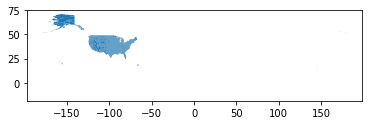

In [9]:
countyborder_trimmed1.plot()

Good. This looks like the US. I guess the reason that this is so small is that it contains Alaska, Hawaii, and  Puerto Rico, which is not a big problem for now. Maybe I can mainly show the Contiguous US portion so that the data is clearer.

## 4. Process my migration CSV data

In this section, I start to process the migration data. It is a CSV file that contains the migration population from one county to another one. Since our project is mainly concerned about the NY metro area. So, we decide to study where the people migrate from New York City specifically (five boroughs of New York City).

First, let me import the file in. Something I did for this step is to make sure the FIPS column is read as "string" intead of "integer" because some of them contain "0" in the first place. 

In [10]:
countymigrationout = pd.read_csv('data2/ny county to other county.csv',dtype={'Current Residence FIPS County Code':str,'Previous Residence FIPS County Code':str})

Now, the dataset is here in the file.

I wanna take a look of it:

In [11]:
countymigrationout.head()

,Current Residence FIPS County Code,State of Current Residence,County of Current Residence,Previous Residence FIPS County Code,State of Previous Residence,County of Previous Residence,Movers in County-to-County Flow
0,01103,Alabama,Morgan County,36001,New York,Albany County,14
1,02090,Alaska,Fairbanks North Star Borough,36001,New York,Albany County,21
2,02220,Alaska,Sitka City and Borough,36001,New York,Albany County,4
3,04001,Arizona,Apache County,36001,New York,Albany County,18
4,04003,Arizona,Cochise County,36001,New York,Albany County,14


In [12]:
countymigrationout.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9950 entries, 0 to 9949
Data columns (total 7 columns):
 #   Column                               Non-Null Count  Dtype 
---  ------                               --------------  ----- 
 0   Current Residence FIPS County Code   9950 non-null   object
 1   State of Current Residence           9950 non-null   object
 2   County of Current Residence          9950 non-null   object
 3   Previous Residence FIPS County Code  9950 non-null   object
 4   State of Previous Residence          9950 non-null   object
 5   County of Previous Residence         9950 non-null   object
 6   Movers in County-to-County Flow      9950 non-null   int64 
dtypes: int64(1), object(6)
memory usage: 544.3+ KB


This dataset looks good!It contains all info I will be using in the following sections. Also, the FIPS codes are all objects, while all migration population are "numbers".

Now, I want to rename the columns to make it have no "spaces" between the words. Sometimes, I find if there are spaces between texts, I may encounter some problems in the future.

In [13]:
countymigrationout.columns = ['Current_FIPS','Current_State','Current_County','Previous_FIPS','Previous_State','Previous_County','Migration']

countymigrationout.head()

,Current_FIPS,Current_State,Current_County,Previous_FIPS,Previous_State,Previous_County,Migration
0,01103,Alabama,Morgan County,36001,New York,Albany County,14
1,02090,Alaska,Fairbanks North Star Borough,36001,New York,Albany County,21
2,02220,Alaska,Sitka City and Borough,36001,New York,Albany County,4
3,04001,Arizona,Apache County,36001,New York,Albany County,18
4,04003,Arizona,Cochise County,36001,New York,Albany County,14


Looks great! That is what I expected. 

Now, I'll start the "sorting" job by looking for the counties that within New York City (five counties: New York, Bronx, QUeens, Kings, Richmond).

I create a new column called "NYC". I write some "if" condition codes to make it identify if it is one of the five counties in NYC. If it is, then a "Yes" will be assigned to the new column "NYC":

In [14]:
countymigrationout['NYC'] = 'No'
countymigrationout.loc[countymigrationout['Previous_County'] == 'New York County', 'NYC'] = 'Yes'
countymigrationout.loc[countymigrationout['Previous_County'] == 'Bronx County', 'NYC'] = 'Yes'
countymigrationout.loc[countymigrationout['Previous_County'] == 'Queens County', 'NYC'] = 'Yes'
countymigrationout.loc[countymigrationout['Previous_County'] == 'Kings County', 'NYC'] = 'Yes'
countymigrationout.loc[countymigrationout['Previous_County'] == 'Richmond County', 'NYC'] = 'Yes'

countymigrationout

,Current_FIPS,Current_State,Current_County,Previous_FIPS,Previous_State,Previous_County,Migration,NYC
0,01103,Alabama,Morgan County,36001,New York,Albany County,14,No
1,02090,Alaska,Fairbanks North Star Borough,36001,New York,Albany County,21,No
2,02220,Alaska,Sitka City and Borough,36001,New York,Albany County,4,No
3,04001,Arizona,Apache County,36001,New York,Albany County,18,No
4,04003,Arizona,Cochise County,36001,New York,Albany County,14,No
5,04013,Arizona,Maricopa County,36001,New York,Albany County,75,No
6,04019,Arizona,Pima County,36001,New York,Albany County,17,No
7,06029,California,Kern County,36001,New York,Albany County,31,No
8,06037,California,Los Angeles County,36001,New York,Albany County,97,No
9,06041,California,Marin County,36001,New York,Albany County,21,No


Perfect! It looks it is working! Now all rows that have the previous county that is in NYC 5 counites are assigned with a "Yes" in the last column.

Now, I want to trim this dataset by keeping only the rows with "Yes":

In [15]:
countymigrationout_trimmed = countymigrationout[countymigrationout.NYC =='Yes']

countymigrationout_trimmed

,Current_FIPS,Current_State,Current_County,Previous_FIPS,Previous_State,Previous_County,Migration,NYC
311,01015,Alabama,Calhoun County,36005,New York,Bronx County,16,Yes
312,01065,Alabama,Hale County,36005,New York,Bronx County,15,Yes
313,01069,Alabama,Houston County,36005,New York,Bronx County,9,Yes
314,01073,Alabama,Jefferson County,36005,New York,Bronx County,83,Yes
315,01089,Alabama,Madison County,36005,New York,Bronx County,10,Yes
316,04013,Arizona,Maricopa County,36005,New York,Bronx County,75,Yes
317,04019,Arizona,Pima County,36005,New York,Bronx County,25,Yes
318,04021,Arizona,Pinal County,36005,New York,Bronx County,100,Yes
319,04027,Arizona,Yuma County,36005,New York,Bronx County,5,Yes
320,06001,California,Alameda County,36005,New York,Bronx County,78,Yes


Good. This works! This is the list of migration from NYC 5 counties.

Now, I'm gonna take a look this dataset to make sure the data is good:

In [16]:
countymigrationout_trimmed.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2230 entries, 311 to 7363
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Current_FIPS     2230 non-null   object
 1   Current_State    2230 non-null   object
 2   Current_County   2230 non-null   object
 3   Previous_FIPS    2230 non-null   object
 4   Previous_State   2230 non-null   object
 5   Previous_County  2230 non-null   object
 6   Migration        2230 non-null   int64 
 7   NYC              2230 non-null   object
dtypes: int64(1), object(7)
memory usage: 156.8+ KB


Looks good! The migration is "number" and the FIPS code is "object". there are no null values. This is good to go:

Now, I want to group the rows by where people currently live and sum the migration people:

In [17]:
countymigrationout_trimmed = countymigrationout_trimmed.groupby(by=["Current_FIPS"]).sum()

countymigrationout_trimmed

,Migration
Current_FIPS,
01015,34
01017,2
01033,71
01039,1
01045,57
01049,6
01055,19
01065,15
01069,13


This looks good! Now, I have a series of FIPS code associated with the migration population. This is a list where NYC 5 counties people migrate to.

I found the FIPS code column becomes the index column, which is not ideal. 

Now, I want to reset the index so that we have the index numbers instead of FIPS:

In [18]:
countymigrationout_trimmed = countymigrationout_trimmed.reset_index()
countymigrationout_trimmed.head()

,Current_FIPS,Migration
0,01015,34
1,01017,2
2,01033,71
3,01039,1
4,01045,57


Looking good! Now we have two columns and an index that is seperated.

Now, I want to rename the columns so that I can match this dataset with others:

In [19]:
countymigrationout_trimmed.columns = ['GEOID','Migration_Out_Population']
countymigrationout_trimmed.head()

,GEOID,Migration_Out_Population
0,01015,34
1,01017,2
2,01033,71
3,01039,1
4,01045,57


Looking good. This GEOID column is the identifier that I can use to merge with the earlier geo-data

## 5. Merge the two dataset

In this section, I will merge the two dataset so that I can start doing the map and looking for some insights:

First, I will make the two dataset by "GEOID":

In [20]:
NYcountymigration_geo_NYmetro = countyborder_trimmed1.merge(countymigrationout_trimmed, on="GEOID")

NYcountymigration_geo_NYmetro.head()

,GEOID,STATEFP,NAME,geometry,Migration_Out_Population
0,21093,21,Hardin,"POLYGON ((-86.27756 37.58881, -86.27420 37.589...",41
1,17197,17,Will,"POLYGON ((-88.26127 41.72466, -88.25477 41.724...",37
2,01055,01,Etowah,"POLYGON ((-86.36962 33.94118, -86.36804 33.942...",19
3,01065,01,Hale,"POLYGON ((-87.87046 32.76244, -87.86818 32.765...",15
4,01089,01,Madison,"POLYGON ((-86.78955 34.56799, -86.78869 34.597...",52


Looking great! Now I have a new dataframe that contains both the name, the migration population, and the geo-data.

I want to take a look what it looks like in the map:

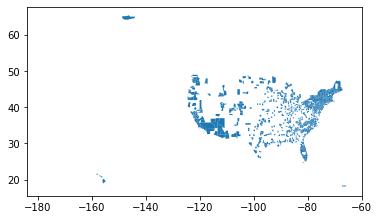

In [21]:
NYcountymigration_geo_NYmetro.plot()

This looks good!! Some counties are white because there's no people migrate from NYC to those counties. This means the dataset looks good. 

Now, I hope to make some groups again by dividing the dataframe into two categories: NY Metro region and Non NY Metro region. After I do this, I am able to what is the migration-in pattern for our study area:

For now, the following code looks very long and repetitive. I'm still trying to find a simplier way to do it. Now it is a "if" condition: when the GEOID is one of those 31 counites in our study area, then a "Yes" will be assigned to the new column "NY Metro":

In [22]:
NYcountymigration_geo_NYmetro['NY_Metro'] = 'No'
NYcountymigration_geo_NYmetro.loc[NYcountymigration_geo_NYmetro['GEOID'] == '09001','NY_Metro'] = 'Yes'
NYcountymigration_geo_NYmetro.loc[NYcountymigration_geo_NYmetro['GEOID'] == '09005','NY_Metro'] = 'Yes'
NYcountymigration_geo_NYmetro.loc[NYcountymigration_geo_NYmetro['GEOID'] == '09009','NY_Metro'] = 'Yes'
NYcountymigration_geo_NYmetro.loc[NYcountymigration_geo_NYmetro['GEOID'] == '34003','NY_Metro'] = 'Yes'
NYcountymigration_geo_NYmetro.loc[NYcountymigration_geo_NYmetro['GEOID'] == '34013','NY_Metro'] = 'Yes'
NYcountymigration_geo_NYmetro.loc[NYcountymigration_geo_NYmetro['GEOID'] == '34017','NY_Metro'] = 'Yes'
NYcountymigration_geo_NYmetro.loc[NYcountymigration_geo_NYmetro['GEOID'] == '34019','NY_Metro'] = 'Yes'
NYcountymigration_geo_NYmetro.loc[NYcountymigration_geo_NYmetro['GEOID'] == '34021','NY_Metro'] = 'Yes'
NYcountymigration_geo_NYmetro.loc[NYcountymigration_geo_NYmetro['GEOID'] == '34023','NY_Metro'] = 'Yes'
NYcountymigration_geo_NYmetro.loc[NYcountymigration_geo_NYmetro['GEOID'] == '34025','NY_Metro'] = 'Yes'
NYcountymigration_geo_NYmetro.loc[NYcountymigration_geo_NYmetro['GEOID'] == '34027','NY_Metro'] = 'Yes'
NYcountymigration_geo_NYmetro.loc[NYcountymigration_geo_NYmetro['GEOID'] == '34029','NY_Metro'] = 'Yes'
NYcountymigration_geo_NYmetro.loc[NYcountymigration_geo_NYmetro['GEOID'] == '34031','NY_Metro'] = 'Yes'
NYcountymigration_geo_NYmetro.loc[NYcountymigration_geo_NYmetro['GEOID'] == '34035','NY_Metro'] = 'Yes'
NYcountymigration_geo_NYmetro.loc[NYcountymigration_geo_NYmetro['GEOID'] == '34037','NY_Metro'] = 'Yes'
NYcountymigration_geo_NYmetro.loc[NYcountymigration_geo_NYmetro['GEOID'] == '34039','NY_Metro'] = 'Yes'
NYcountymigration_geo_NYmetro.loc[NYcountymigration_geo_NYmetro['GEOID'] == '36005','NY_Metro'] = 'Yes'
NYcountymigration_geo_NYmetro.loc[NYcountymigration_geo_NYmetro['GEOID'] == '36027','NY_Metro'] = 'Yes'
NYcountymigration_geo_NYmetro.loc[NYcountymigration_geo_NYmetro['GEOID'] == '36047','NY_Metro'] = 'Yes'
NYcountymigration_geo_NYmetro.loc[NYcountymigration_geo_NYmetro['GEOID'] == '36059','NY_Metro'] = 'Yes'
NYcountymigration_geo_NYmetro.loc[NYcountymigration_geo_NYmetro['GEOID'] == '36061','NY_Metro'] = 'Yes'
NYcountymigration_geo_NYmetro.loc[NYcountymigration_geo_NYmetro['GEOID'] == '36071','NY_Metro'] = 'Yes'
NYcountymigration_geo_NYmetro.loc[NYcountymigration_geo_NYmetro['GEOID'] == '36079','NY_Metro'] = 'Yes'
NYcountymigration_geo_NYmetro.loc[NYcountymigration_geo_NYmetro['GEOID'] == '36081','NY_Metro'] = 'Yes'
NYcountymigration_geo_NYmetro.loc[NYcountymigration_geo_NYmetro['GEOID'] == '36085','NY_Metro'] = 'Yes'
NYcountymigration_geo_NYmetro.loc[NYcountymigration_geo_NYmetro['GEOID'] == '36087','NY_Metro'] = 'Yes'
NYcountymigration_geo_NYmetro.loc[NYcountymigration_geo_NYmetro['GEOID'] == '36103','NY_Metro'] = 'Yes'
NYcountymigration_geo_NYmetro.loc[NYcountymigration_geo_NYmetro['GEOID'] == '36111','NY_Metro'] = 'Yes'
NYcountymigration_geo_NYmetro.loc[NYcountymigration_geo_NYmetro['GEOID'] == '36119','NY_Metro'] = 'Yes'
NYcountymigration_geo_NYmetro.loc[NYcountymigration_geo_NYmetro['GEOID'] == '42089','NY_Metro'] = 'Yes'
NYcountymigration_geo_NYmetro.loc[NYcountymigration_geo_NYmetro['GEOID'] == '42103','NY_Metro'] = 'Yes'

NYcountymigration_geo_NYmetro

,GEOID,STATEFP,NAME,geometry,Migration_Out_Population,NY_Metro
0,21093,21,Hardin,"POLYGON ((-86.27756 37.58881, -86.27420 37.589...",41,No
1,17197,17,Will,"POLYGON ((-88.26127 41.72466, -88.25477 41.724...",37,No
2,01055,01,Etowah,"POLYGON ((-86.36962 33.94118, -86.36804 33.942...",19,No
3,01065,01,Hale,"POLYGON ((-87.87046 32.76244, -87.86818 32.765...",15,No
4,01089,01,Madison,"POLYGON ((-86.78955 34.56799, -86.78869 34.597...",52,No
5,01117,01,Shelby,"POLYGON ((-87.02685 33.24646, -86.98289 33.246...",4,No
6,06001,06,Alameda,"POLYGON ((-122.34225 37.80556, -122.33412 37.8...",1257,No
7,06003,06,Alpine,"POLYGON ((-120.07239 38.70277, -120.06762 38.7...",3,No
8,06005,06,Amador,"POLYGON ((-121.02741 38.50354, -121.02747 38.5...",23,No
9,06013,06,Contra Costa,"POLYGON ((-122.42976 37.96540, -122.41859 37.9...",613,No


This looks good! some counites are assigned with "Yes" and they are within NY metro region. Now, I have a list of county that is within our study area.

Now, I want to trim this dataset so that I only have those NY metro counties:

In [23]:
NYcountymigration_geo_NYmetro_trimmed = NYcountymigration_geo_NYmetro[NYcountymigration_geo_NYmetro.NY_Metro =='Yes']

NYcountymigration_geo_NYmetro_trimmed

,GEOID,STATEFP,NAME,geometry,Migration_Out_Population,NY_Metro
18,09009,09,New Haven,"MULTIPOLYGON (((-72.76143 41.24233, -72.75973 ...",2511,Yes
37,34003,34,Bergen,"POLYGON ((-74.27066 41.02103, -74.25046 41.060...",6405,Yes
39,34013,34,Essex,"POLYGON ((-74.37623 40.76275, -74.37389 40.762...",6421,Yes
40,34023,34,Middlesex,"POLYGON ((-74.63023 40.34313, -74.63047 40.344...",2876,Yes
46,36047,36,Kings,"POLYGON ((-74.04201 40.62605, -74.04199 40.626...",36341,Yes
50,36081,36,Queens,"POLYGON ((-73.96262 40.73903, -73.96138 40.742...",29775,Yes
148,34019,34,Hunterdon,"POLYGON ((-75.19511 40.57969, -75.19466 40.581...",107,Yes
149,34021,34,Mercer,"POLYGON ((-74.94228 40.34089, -74.93228 40.339...",1559,Yes
150,34025,34,Monmouth,"POLYGON ((-74.61458 40.18238, -74.59963 40.186...",3546,Yes
151,34029,34,Ocean,"POLYGON ((-74.55311 40.07913, -74.53347 40.087...",1349,Yes


Looking good! This is a list of county in our study area.

Next, I hope to sort this dataframe so that I know which county has the most and least migration-in popultion:

In [24]:
NY_County_Migration_Finding_A = NYcountymigration_geo_NYmetro_trimmed.sort_values(by='Migration_Out_Population', ascending=False)
NY_County_Migration_Finding_A

,GEOID,STATEFP,NAME,geometry,Migration_Out_Population,NY_Metro
46,36047,36,Kings,"POLYGON ((-74.04201 40.62605, -74.04199 40.626...",36341,Yes
50,36081,36,Queens,"POLYGON ((-73.96262 40.73903, -73.96138 40.742...",29775,Yes
326,36061,36,New York,"MULTIPOLYGON (((-73.99950 40.70033, -73.99750 ...",25180,Yes
833,36005,36,Bronx,"MULTIPOLYGON (((-73.77336 40.85945, -73.77244 ...",24135,Yes
301,36059,36,Nassau,"MULTIPOLYGON (((-73.49097 40.91947, -73.48960 ...",21286,Yes
192,36119,36,Westchester,"MULTIPOLYGON (((-73.77278 40.88460, -73.77231 ...",17355,Yes
863,34017,34,Hudson,"POLYGON ((-74.16598 40.74807, -74.16546 40.751...",10532,Yes
190,36103,36,Suffolk,"MULTIPOLYGON (((-72.03683 41.24984, -72.03496 ...",9179,Yes
688,36085,36,Richmond,"MULTIPOLYGON (((-74.16170 40.64586, -74.16060 ...",6735,Yes
231,09001,09,Fairfield,"MULTIPOLYGON (((-73.21717 41.14391, -73.21611 ...",6535,Yes


Looks great! Now I know King County has the most migration-in popultion while Sussex County has the least migraiton-in popultion. 

I want to save this finding into a CSV so that I can use in the future:

In [25]:
NY_County_Migration_Finding_A.to_csv(r'NY_County_Migration_Finding_A.csv',index=False)

Great. Now this finding is saved as a seperate CSV file so that I can use in the future!

## 6. Mapping the findings:

In this section, I want to map out some finds.

First, I need to import some mapping moduels:

In [26]:
# to provide basemaps 
import contextily as ctx

# to give more power to your figures (plots)
import matplotlib.pyplot as plt

Now, I shall have those modules ready to use. 

I want to map the two dataset - the NYC region one and the national level one:

Now, I have to convert them into CRS:


In [27]:
NYcountymigration_geo_NYmetro_trimmed_web_mercator = NYcountymigration_geo_NYmetro_trimmed.to_crs(epsg=3857)
NYcountymigration_geo_NYmetro_web_mercator = NYcountymigration_geo_NYmetro.to_crs(epsg=3857)

Now, I want to map them out: 

I need to crate multiple sub-layers to make it work. I also do some detailed arguement in it to make it look prettier. Also, I turn off the axis and add a new basemap from another provider:

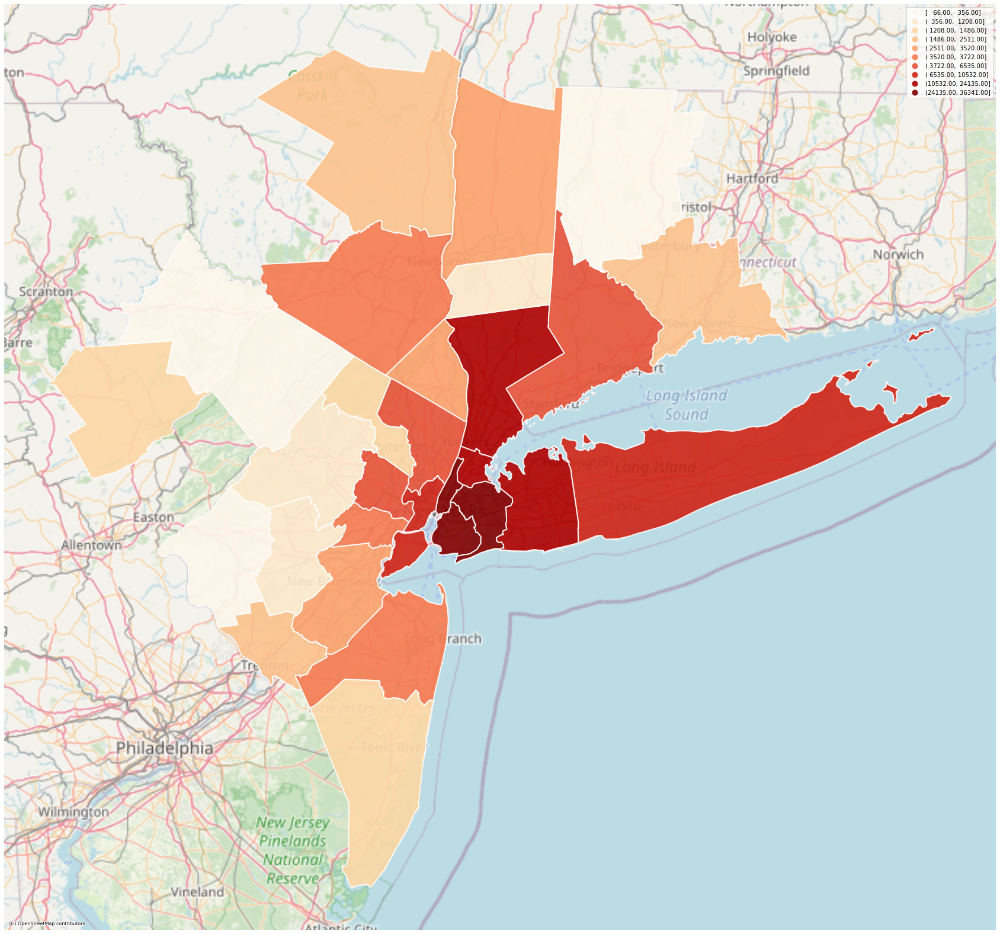

In [28]:
fig, ax = plt.subplots(figsize=(30, 30))

NYcountymigration_geo_NYmetro_trimmed_web_mercator.plot(ax=ax, alpha=0.9, 
                 column='Migration_Out_Population',
                 legend=True, 
                 scheme='Quantiles', 
                 k=10,
                 cmap='OrRd',edgecolor='white',linewidth=2)

ax.axis('off')

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik,alpha=0.8)

This looks good!!! Now, we can clearly visulize where do NYC people migrate to - the deeper the read is, the more population it represents.

Now, I want to present the entire national level:

/opt/conda/lib/python3.8/site-packages/contextily/tile.py:632: UserWarning: The inferred zoom level of 21 is not valid for the current tile provider (valid zooms: 0 - 18).
  warnings.warn(msg)


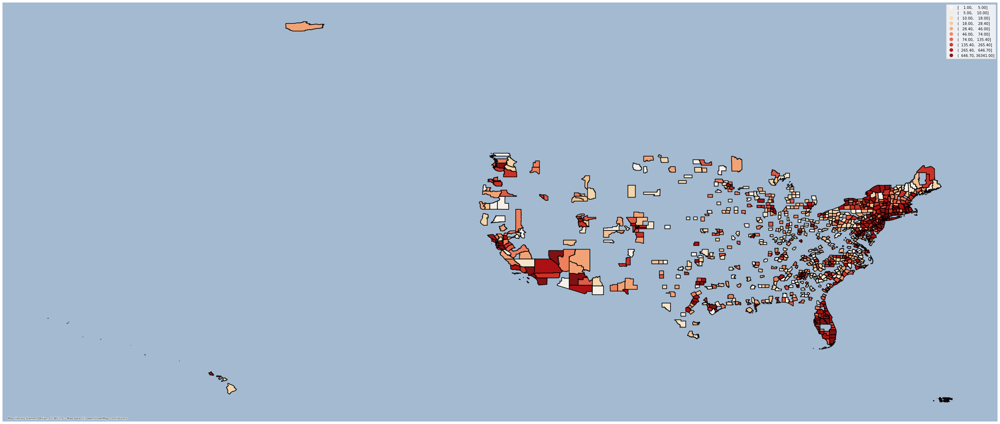

In [29]:
fig, ax = plt.subplots(figsize=(50, 50))

NYcountymigration_geo_NYmetro.plot(ax=ax, alpha=0.9, column='Migration_Out_Population',
                 legend=True, 
                 scheme='Quantiles', k=10,
                cmap='OrRd',edgecolor='black',linewidth=2)

ax.axis('off')

ctx.add_basemap(ax,alpha=0.9)

Oops! Because of the geometry is too big. the zoom-in function is not supported. 

This asks to rethink if I want to show only the mainland data or if I want to use the mapping without basemap

Let me try the one without basemap:

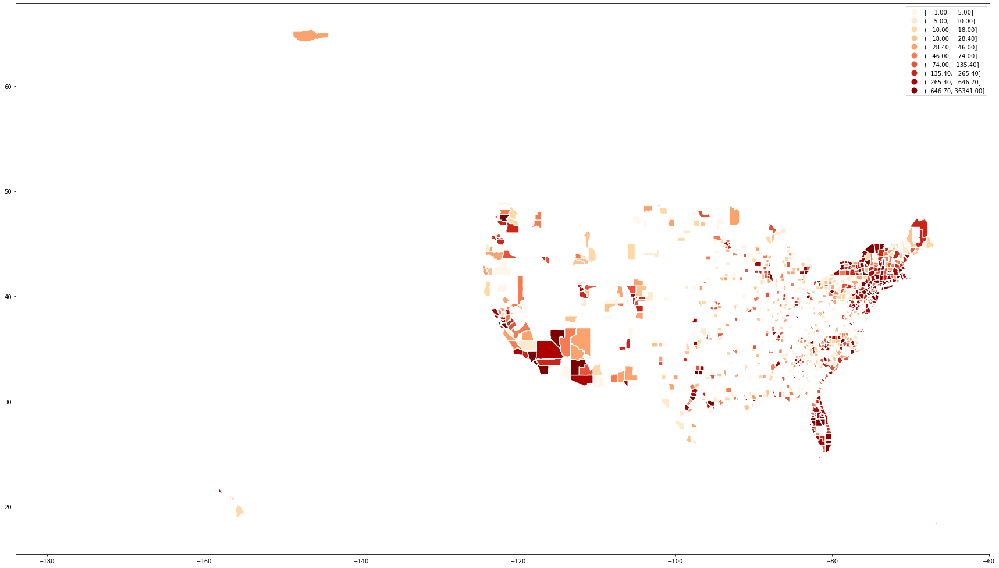

In [30]:
NYcountymigration_geo_NYmetro.plot(figsize=(30,30),
                 column='Migration_Out_Population',
                 legend=True, 
                 scheme='Quantiles', k=10,
                cmap='OrRd',edgecolor='white',linewidth=1.5)

It works!!! The map itself looks good. But I guess it would be a good idea to do some grouping work

## 7. Group the national level data and map it

As mentioned in the previous section, the geometry is too large to be mapped. So, I hope to put all data into three categories: "The Contiguous US - Non NYMETRO", "NYMETRO", and "Non Contiguous US".

First, I want to start a new dataframe for this step so that I don't change any previous code above.

In [31]:
countymigrationout2 = NYcountymigration_geo_NYmetro
countymigrationout2.head()

,GEOID,STATEFP,NAME,geometry,Migration_Out_Population,NY_Metro
0,21093,21,Hardin,"POLYGON ((-86.27756 37.58881, -86.27420 37.589...",41,No
1,17197,17,Will,"POLYGON ((-88.26127 41.72466, -88.25477 41.724...",37,No
2,01055,01,Etowah,"POLYGON ((-86.36962 33.94118, -86.36804 33.942...",19,No
3,01065,01,Hale,"POLYGON ((-87.87046 32.76244, -87.86818 32.765...",15,No
4,01089,01,Madison,"POLYGON ((-86.78955 34.56799, -86.78869 34.597...",52,No


Great. Now I have this dataframe to start with.

I will create a new column called "Region" and decide if one county is in where based on the "if" condition code below:

In [32]:
countymigrationout2['Region'] = 'The Contiguous US - Non NYMETRO'

countymigrationout2.loc[countymigrationout2['GEOID'] == '09001','Region'] = 'NYMETRO'
countymigrationout2.loc[countymigrationout2['GEOID'] == '09005','Region'] = 'NYMETRO'
countymigrationout2.loc[countymigrationout2['GEOID'] == '09009','Region'] = 'NYMETRO'
countymigrationout2.loc[countymigrationout2['GEOID'] == '34003','Region'] = 'NYMETRO'
countymigrationout2.loc[countymigrationout2['GEOID'] == '34013','Region'] = 'NYMETRO'
countymigrationout2.loc[countymigrationout2['GEOID'] == '34017','Region'] = 'NYMETRO'
countymigrationout2.loc[countymigrationout2['GEOID'] == '34019','Region'] = 'NYMETRO'
countymigrationout2.loc[countymigrationout2['GEOID'] == '34021','Region'] = 'NYMETRO'
countymigrationout2.loc[countymigrationout2['GEOID'] == '34023','Region'] = 'NYMETRO'
countymigrationout2.loc[countymigrationout2['GEOID'] == '34025','Region'] = 'NYMETRO'
countymigrationout2.loc[countymigrationout2['GEOID'] == '34027','Region'] = 'NYMETRO'
countymigrationout2.loc[countymigrationout2['GEOID'] == '34029','Region'] = 'NYMETRO'
countymigrationout2.loc[countymigrationout2['GEOID'] == '34031','Region'] = 'NYMETRO'
countymigrationout2.loc[countymigrationout2['GEOID'] == '34035','Region'] = 'NYMETRO'
countymigrationout2.loc[countymigrationout2['GEOID'] == '34037','Region'] = 'NYMETRO'
countymigrationout2.loc[countymigrationout2['GEOID'] == '34039','Region'] = 'NYMETRO'
countymigrationout2.loc[countymigrationout2['GEOID'] == '36005','Region'] = 'NYMETRO'
countymigrationout2.loc[countymigrationout2['GEOID'] == '36027','Region'] = 'NYMETRO'
countymigrationout2.loc[countymigrationout2['GEOID'] == '36047','Region'] = 'NYMETRO'
countymigrationout2.loc[countymigrationout2['GEOID'] == '36059','Region'] = 'NYMETRO'
countymigrationout2.loc[countymigrationout2['GEOID'] == '36061','Region'] = 'NYMETRO'
countymigrationout2.loc[countymigrationout2['GEOID'] == '36071','Region'] = 'NYMETRO'
countymigrationout2.loc[countymigrationout2['GEOID'] == '36079','Region'] = 'NYMETRO'
countymigrationout2.loc[countymigrationout2['GEOID'] == '36081','Region'] = 'NYMETRO'
countymigrationout2.loc[countymigrationout2['GEOID'] == '36085','Region'] = 'NYMETRO'
countymigrationout2.loc[countymigrationout2['GEOID'] == '36087','Region'] = 'NYMETRO'
countymigrationout2.loc[countymigrationout2['GEOID'] == '36103','Region'] = 'NYMETRO'
countymigrationout2.loc[countymigrationout2['GEOID'] == '36111','Region'] = 'NYMETRO'
countymigrationout2.loc[countymigrationout2['GEOID'] == '36119','Region'] = 'NYMETRO'
countymigrationout2.loc[countymigrationout2['GEOID'] == '42089','Region'] = 'NYMETRO'
countymigrationout2.loc[countymigrationout2['GEOID'] == '42103','Region'] = 'NYMETRO'

countymigrationout2.loc[countymigrationout2['STATEFP'] == '02','Region'] = 'Non Contiguous US'
countymigrationout2.loc[countymigrationout2['STATEFP'] == '72','Region'] = 'Non Contiguous US'
countymigrationout2.loc[countymigrationout2['STATEFP'] == '15','Region'] = 'Non Contiguous US'


countymigrationout2.head()

,GEOID,STATEFP,NAME,geometry,Migration_Out_Population,NY_Metro,Region
0,21093,21,Hardin,"POLYGON ((-86.27756 37.58881, -86.27420 37.589...",41,No,The Contiguous US - Non NYMETRO
1,17197,17,Will,"POLYGON ((-88.26127 41.72466, -88.25477 41.724...",37,No,The Contiguous US - Non NYMETRO
2,01055,01,Etowah,"POLYGON ((-86.36962 33.94118, -86.36804 33.942...",19,No,The Contiguous US - Non NYMETRO
3,01065,01,Hale,"POLYGON ((-87.87046 32.76244, -87.86818 32.765...",15,No,The Contiguous US - Non NYMETRO
4,01089,01,Madison,"POLYGON ((-86.78955 34.56799, -86.78869 34.597...",52,No,The Contiguous US - Non NYMETRO


It looks good! Now, we have a new column that identify if that county is in NY metro or other places.

The next step is for me to group them. By doing this, I can see where do NYC people migrate to in a general category:

In [33]:
countymigrationout3 = countymigrationout2.groupby(by=["Region"]).sum()
countymigrationout3

,Migration_Out_Population
Region,
NYMETRO,233127
Non Contiguous US,3102
The Contiguous US - Non NYMETRO,193898


This looks good! Now the entire migration population is divided into the three general categories.

Now, I want to see it in a bar graph:

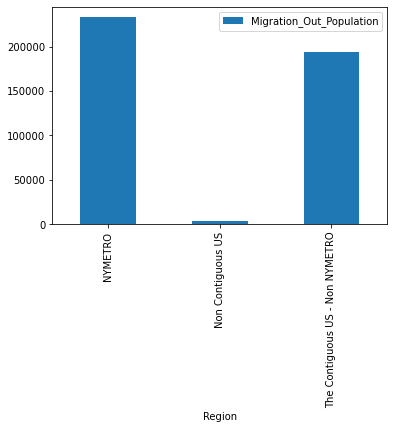

In [34]:
countymigrationout3.plot(kind="bar")

This looks good! This helps me visually understand where NYC people move out.

The next step is to map the migration people in the contiguous US area (without Alaska, Hawaii, and Puerto Rico area)

First, I need to have a new dataframe that exclude the "non-contiguous US" area

In [35]:
countymigrationout4 = countymigrationout2[countymigrationout2.Region !='Non Contiguous US']
countymigrationout4

,GEOID,STATEFP,NAME,geometry,Migration_Out_Population,NY_Metro,Region
0,21093,21,Hardin,"POLYGON ((-86.27756 37.58881, -86.27420 37.589...",41,No,The Contiguous US - Non NYMETRO
1,17197,17,Will,"POLYGON ((-88.26127 41.72466, -88.25477 41.724...",37,No,The Contiguous US - Non NYMETRO
2,01055,01,Etowah,"POLYGON ((-86.36962 33.94118, -86.36804 33.942...",19,No,The Contiguous US - Non NYMETRO
3,01065,01,Hale,"POLYGON ((-87.87046 32.76244, -87.86818 32.765...",15,No,The Contiguous US - Non NYMETRO
4,01089,01,Madison,"POLYGON ((-86.78955 34.56799, -86.78869 34.597...",52,No,The Contiguous US - Non NYMETRO
5,01117,01,Shelby,"POLYGON ((-87.02685 33.24646, -86.98289 33.246...",4,No,The Contiguous US - Non NYMETRO
6,06001,06,Alameda,"POLYGON ((-122.34225 37.80556, -122.33412 37.8...",1257,No,The Contiguous US - Non NYMETRO
7,06003,06,Alpine,"POLYGON ((-120.07239 38.70277, -120.06762 38.7...",3,No,The Contiguous US - Non NYMETRO
8,06005,06,Amador,"POLYGON ((-121.02741 38.50354, -121.02747 38.5...",23,No,The Contiguous US - Non NYMETRO
9,06013,06,Contra Costa,"POLYGON ((-122.42976 37.96540, -122.41859 37.9...",613,No,The Contiguous US - Non NYMETRO


It looks great! Now, I only have a list of contiguous US counties.

Now, let me polt them out to see if it works.

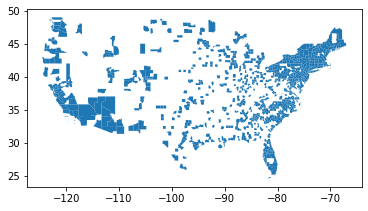

In [36]:
countymigrationout4.plot()

Yes, it works! I can now see where do NYC people move.

Next, I want to create a map that is clearer and prettier to communicate this idea.

First, I need to convert the data to CRS.

Then, I set up the sublayers, add more detailed argument to the plot such as color, scheme, etc, lastly add a new base map below as the reference.

In [37]:
countymigrationout_national_web_mercator = countymigrationout4.to_crs(epsg=3857)

Text(0.5, 1.0, 'How Many People Migrate from New York City to Other Counties?')

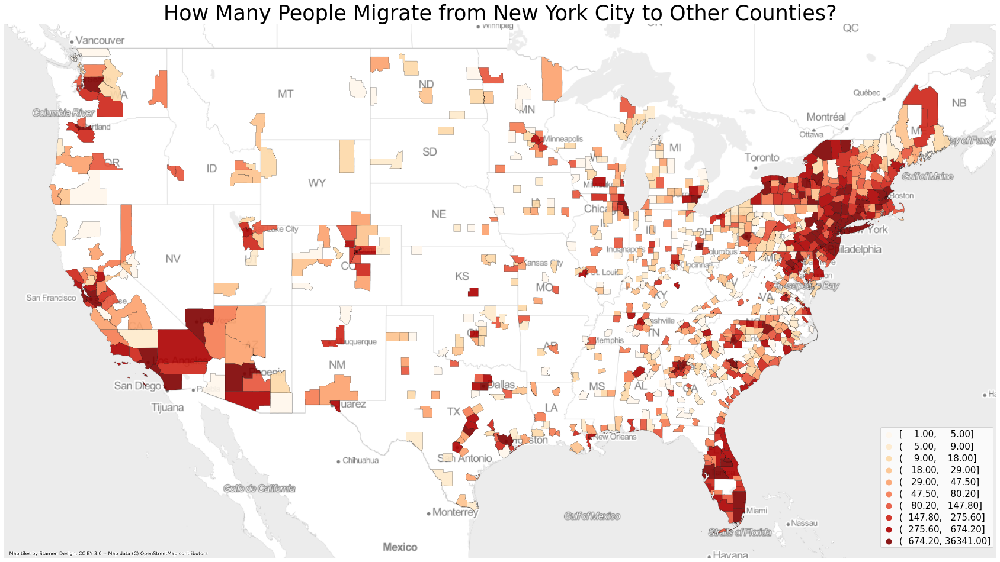

In [38]:
fig, ax = plt.subplots(figsize=(30, 30))

countymigrationout_national_web_mercator.plot(ax=ax, alpha=0.9, column='Migration_Out_Population',
                 legend=True,
                 scheme='Quantiles', k=10,
                cmap='OrRd',edgecolor='black',linewidth=0.25)

leg = ax.get_legend()
leg.prop.set_size(15)
leg.set_bbox_to_anchor((0., 0.2, 1., 0.05))

ax.axis('off')

ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite, alpha=0.5)

ax.set_title("How Many People Migrate from New York City to Other Counties?",fontsize=35)


It works! Now, I can see the dataframe is clearly shown in the map. 

Now, I want to filter the data a little bit by looking for the counties with more than 1000 migration popuulation from NYC area:

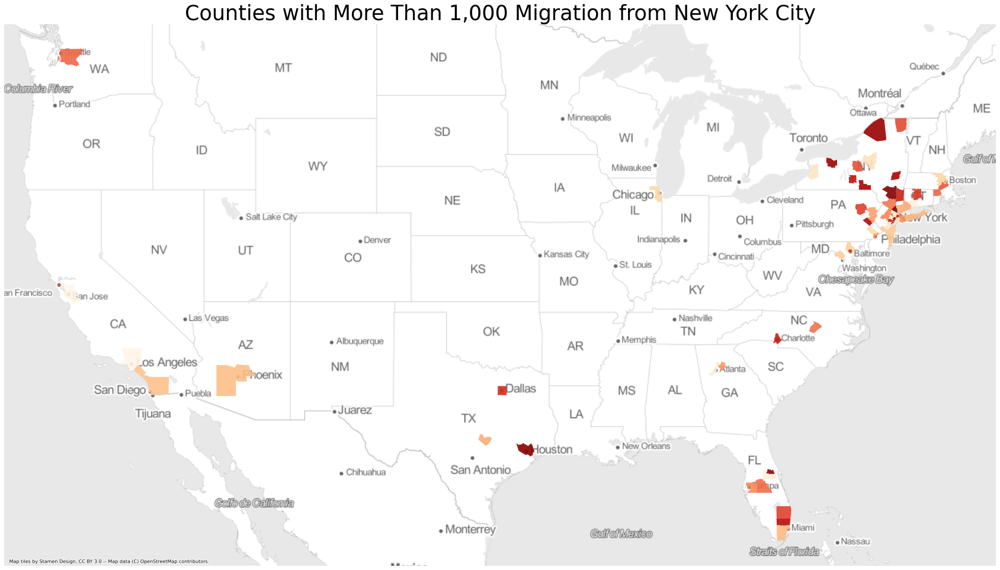

In [39]:
fig, ax = plt.subplots(figsize=(30, 30))

countymigrationout_national_web_mercator[countymigrationout_national_web_mercator['Migration_Out_Population'] > 1000].plot(ax=ax, alpha=0.9,cmap='OrRd')

ax.axis('off')

ax.set_title("Counties with More Than 1,000 Migration from New York City",fontsize=35)

ctx.add_basemap(ax,source=ctx.providers.Stamen.TonerLite, alpha=0.6)

I think I have reached what I expected in the beginning. And I think it works!


To be honest, I spent lots of time this week on figuring out the new argument codes that help me process the excel code in python. It's harder than I expected and I feel like there're still lots of things I want to do.

For the midterm deliverables, I want to continue processing all remaining data to have some comprehensive findings. 